In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import RidgeCV
from preparation import scale_numeric, encode_categorical, join_numeric_categorical
from preprocess import treat_NA
from scores import get_scores
from postprocess import eliminate_negatives

In [2]:
df_preprocessed = pd.read_csv('..\df_preprocessed_2015-2019.csv')

In [3]:
numeric_features = ['distance', 'traffic', 'temperature','precipIntensity', 'Q', 'MA_10',
                    'precipProbability', 'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 
                    'windSpeed', 'windGust', 'windBearing', 'cloudCover', 'uvIndex', 'visibility',
                    'precipAccumulation', 'ozone', 'Wingspan, ft', 'Length, ft', 'TO -1', 'TO -2',                         'TO -3']

categorical_features = ['aobt_day', 'aobt_month', 'aobt_hour', 'aobt_minute', 'aobt_year',
                        'flight_weekday', 'flight_hour', 'flight_minute', 'summary', 'Stand', 'Runway',
                        '# Engines', 'Manufacturer','Wake Category', 'Final']


In [4]:
y_train = df_preprocessed[df_preprocessed['aobt_year'].isin([2015, 2016, 2017, 2018])]['TO']
#y_train = np.log10(y_train, where = (y_train != 0))

y_test = df_preprocessed[df_preprocessed['aobt_year'] == 2019]['TO']
#y_test = np.log10(y_test, where = (y_test != 0))

In [5]:
df_numeric = scale_numeric(df_preprocessed, numeric_features)
df_categorical = encode_categorical(df_preprocessed, categorical_features)
df_prepared = join_numeric_categorical(df_numeric, df_categorical)
#df_prepared.to_csv('df_prepared.csv')

Year features damage performance significantly - drop them!

In [6]:
train = df_prepared[(df_prepared.aobt_year_2015 == 1) | (df_prepared.aobt_year_2016 == 1) | (df_prepared.aobt_year_2017 == 1) | (df_prepared.aobt_year_2018 == 1)]
test = df_prepared[df_prepared.aobt_year_2019 == 1]

X_train = train.loc[:, train.columns != 'TO'].drop(['aobt_year_2015', 'aobt_year_2016',                                                                    'aobt_year_2017', 'aobt_year_2018',                                                                    'aobt_year_2019'], axis = 1)
X_test = test.loc[:, test.columns != 'TO'].drop(['aobt_year_2015', 'aobt_year_2016','aobt_year_2017',                                                   'aobt_year_2018', 'aobt_year_2019'], axis = 1)
#X_test = test.loc[:, test.columns != 'TO'].drop(['aobt_year_2018'])

In [7]:
X_test = treat_NA(X_test)

In [8]:
regr = RidgeCV()
regr.fit(X_train,y_train)
y_pred=regr.predict(X_test)
y_pred = eliminate_negatives(y_pred)

In [9]:
# The coefficients
print('Coefficients: \n', regr.coef_.sort())

scores = get_scores(y_test.to_numpy(), y_pred, metrics=['rmse','mae','r2','first_quartile_error','third_quartile_error'])
for k,v in scores.items():
    print("{}:\n{:0.2f}".format(k,v))

Coefficients: 
 None
[439.83746362 180.86739185 353.76886007 ... 200.71083113 267.28329359
 163.08054528]
rmse:
436.24
mae:
251.29
r2:
0.23
first_quartile_error:
82.56
third_quartile_error:
307.95


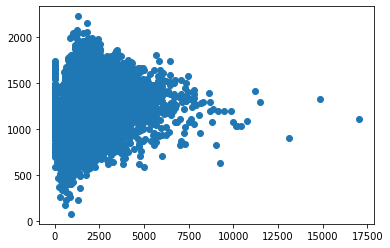

In [10]:
plt.scatter(y_test, y_pred)